<a href="https://colab.research.google.com/github/bamirandab/buenos_aires_cars/blob/main/notebooks/EDA_%26_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploratory Data Analisis - EDA

In [ ]:
!wget https://cdn.buenosaires.gob.ar/datosabiertos/datasets/ausa/flujo-vehicular-por-radares-ausa/flujo-vehicular-por-radares-2022.csv -d /content/data

In [ ]:
!wget https://cdn.buenosaires.gob.ar/datosabiertos/datasets/ausa/flujo-vehicular-por-radares-ausa/flujo-vehicular-por-radares-2021.csv -d /content/data

In [ ]:
!wget https://cdn.buenosaires.gob.ar/datosabiertos/datasets/ausa/flujo-vehicular-por-radares-ausa/flujo-vehicular-por-radares-2020.csv /content/data

In [ ]:
!wget https://cdn.buenosaires.gob.ar/datosabiertos/datasets/ausa/flujo-vehicular-por-radares-ausa/flujo-vehicular-por-radares-2019.csv

In [ ]:
!mkdir /content/data

In [ ]:
!mv /content/*.csv /content/data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import holidays

In [ ]:
years = list(range(2020, 2023))
df2019 = pd.read_csv('/content/data/flujo-vehicular-por-radares-2019.csv')
df2020 = pd.read_csv('/content/data/flujo-vehicular-por-radares-2020.csv')
df2021 = pd.read_csv('/content/data/flujo-vehicular-por-radares-2021.csv')
df2022 = pd.read_csv('/content/data/flujo-vehicular-por-radares-2022.csv', sep=";").dropna(0)

def repair_date_2020(x):
  if len(x) == 8:
    return str(x[:2]) + '20' +  x[2:]
  elif len(x) == 9:
    return str(x[:8]) + '0' +  x[8:]
  else:
    return x

df2020['fecha'] = pd.to_datetime(df2020.fecha.apply(repair_date_2020))

df2022['Disp Ubicacion'] = pd.to_numeric(df2022['Disp Ubicacion'].apply(lambda x: str(x).replace(',','.')))
df2022['Disp Lat'] = pd.to_numeric(df2022['Disp Lat'].apply(lambda x: str(x).replace(',','.')))
df2022['Disp Lng'] = pd.to_numeric(df2022['Disp Lng'].apply(lambda x: str(x).replace(',','.')))
df2021['Disp Ubicacion'] = pd.to_numeric(df2021['Disp Ubicacion'].apply(lambda x: str(x).replace(',','.')))
df2021['Disp Lat'] = pd.to_numeric(df2021['Disp Lat'].fillna('0').apply(lambda x: str(x).replace(',','.')))
df2021['Disp Lng'] = pd.to_numeric(df2021['Disp Lng'].fillna('0').apply(lambda x: str(x).replace(',','.')))
df2021['H_Hora'] = df2021['H_Hora'].fillna(0) + df2021['Hora de H_Fecha'].fillna(0)
df2021 = df2021[['Mes, Día, Año de H_Fecha', 'H_Hora', 'Aut Nombre', 'Disp Nombre',
       'Disp Ubicacion', 'Seccion Sentido', 'Disp Lat', 'Disp Lng',
       'H_Cant_Veh']]

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (4,6,7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
<ipython-input-8-7c69534e92ed>:5: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  df2022 = pd.read_csv('/content/data/flujo-vehicular-por-radares-2022.csv', sep=";").dropna(0)


In [ ]:
cols = df2019.columns
df2021.columns = cols
df2022.columns = cols

In [ ]:
df2019['fecha'] = pd.to_datetime(df2019['fecha'])
df2020['fecha'] = pd.to_datetime(df2020['fecha'])
df2021['fecha'] = pd.to_datetime(df2021['fecha'])
df2021['disp_ubicacion'] = pd.to_numeric(df2021['disp_ubicacion'])
df2021['lat'] = pd.to_numeric(df2021['lat'])
df2021['long'] = pd.to_numeric(df2021['long'])
df2022['fecha'] = pd.to_datetime(df2022['fecha'])

In [ ]:
df = pd.concat([df2019,df2020,df2021,df2022],axis=0, ignore_index=True)
df['mes'] = df.fecha.dt.month
df['year'] = df.fecha.dt.year


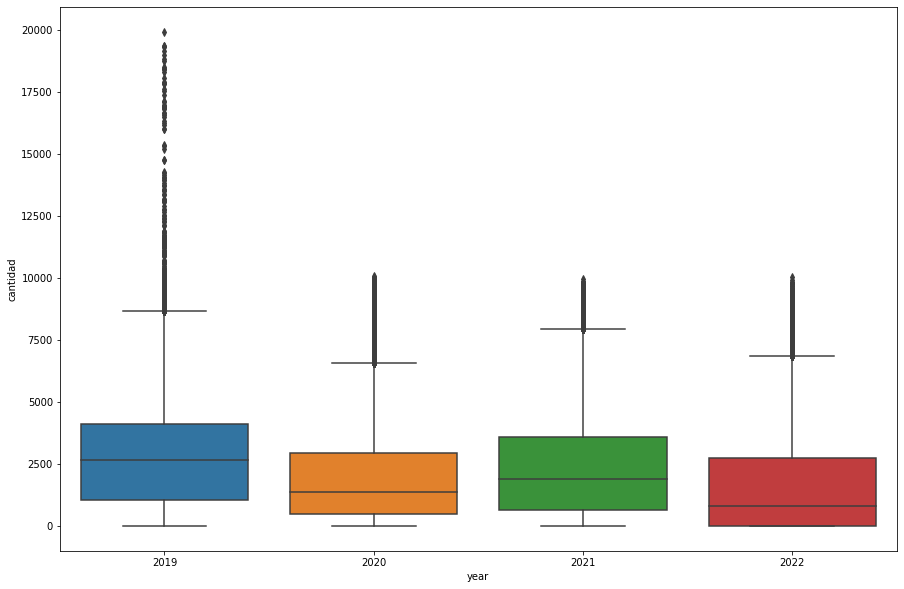

In [ ]:
plt.figure(figsize=(15,10))
sns.boxplot(data=df,x='year',y='cantidad')
plt.show()

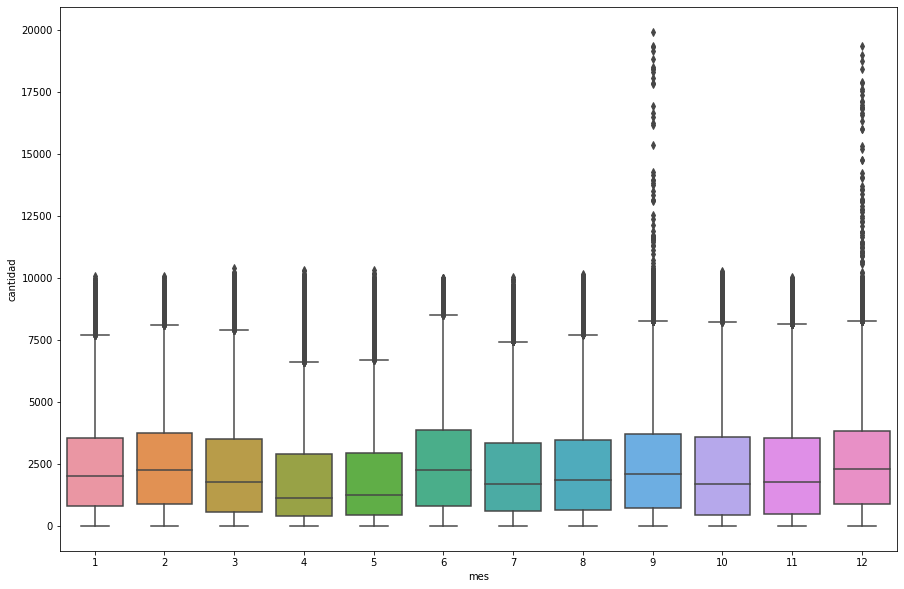

In [ ]:
plt.figure(figsize=(15,10))
sns.boxplot(data=df,x='mes',y='cantidad')
plt.show()

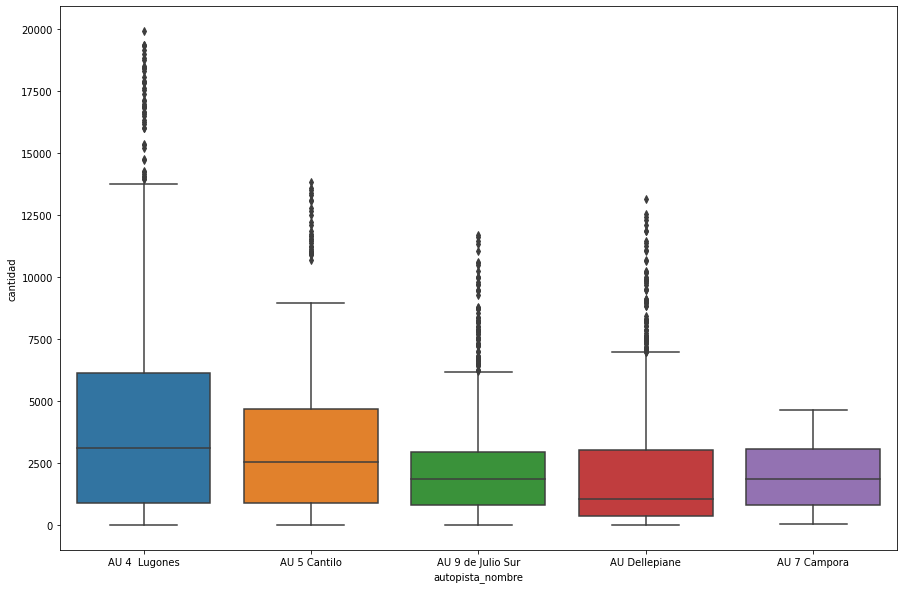

In [ ]:
plt.figure(figsize=(15,10))
sns.boxplot(data=df,x='autopista_nombre',y='cantidad')
plt.show()

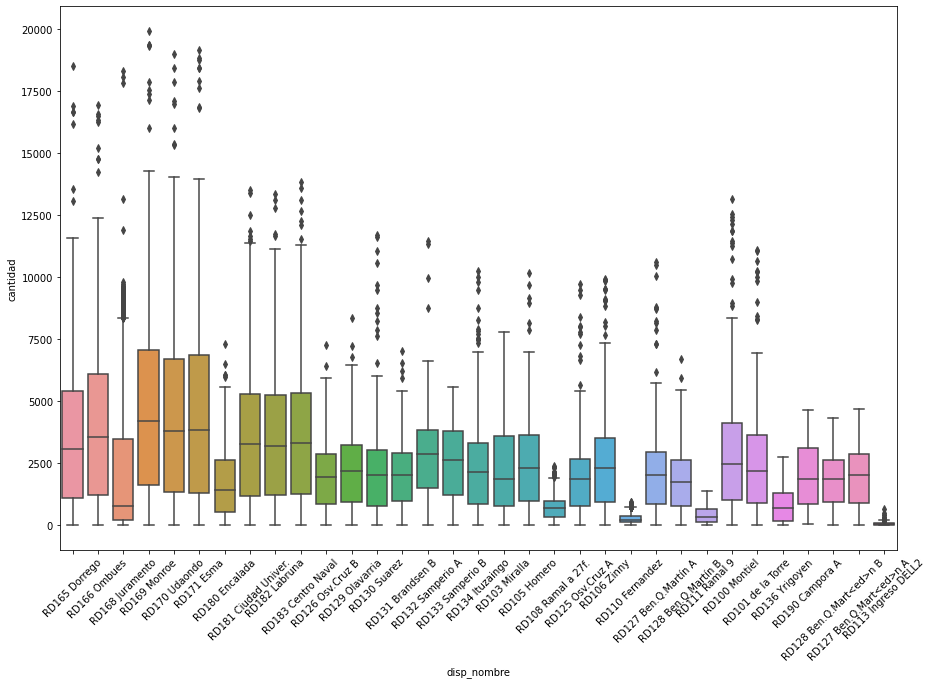

In [ ]:
plt.figure(figsize=(15,10))
sns.boxplot(data=df,x='disp_nombre',y='cantidad')
plt.xticks(rotation = 45)
plt.show()

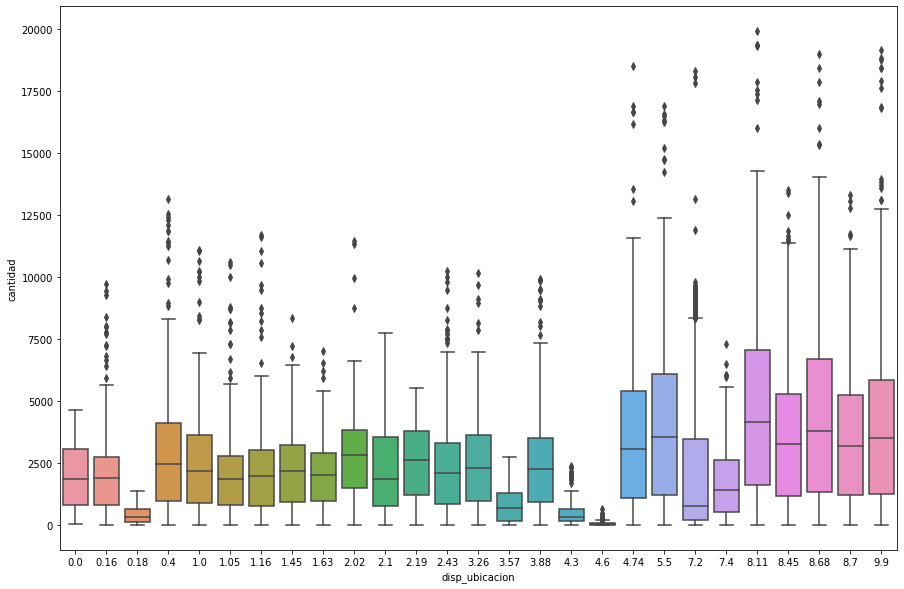

In [ ]:
plt.figure(figsize=(15,10))
sns.boxplot(data=df, x='disp_ubicacion',y='cantidad' )
plt.show()

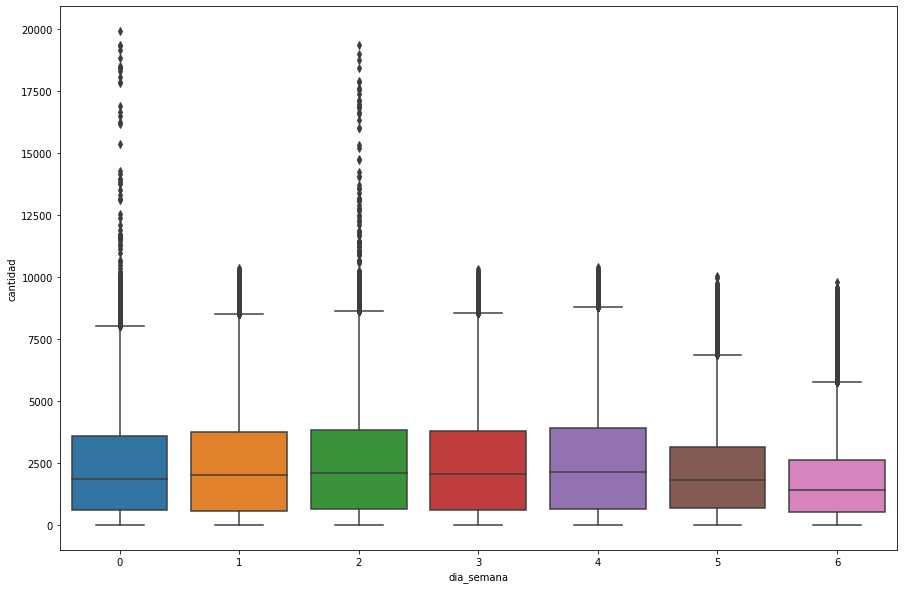

In [ ]:
df['dia_semana'] = df.fecha.dt.weekday

plt.figure(figsize=(15,10))
sns.boxplot(data=df, x='dia_semana',y='cantidad' )
plt.show()

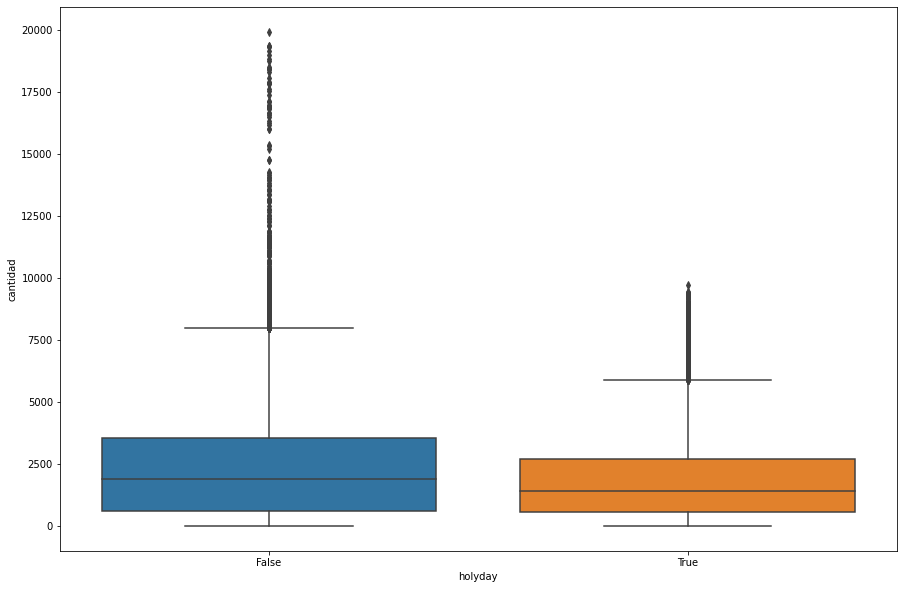

In [ ]:
holydays_arg = holidays.ARG(years=[2019,2020,2021,2022])
df['holyday'] = df.fecha.apply(lambda x: True if x in holydays_arg else False)

plt.figure(figsize=(15,10))
sns.boxplot(data=df, x='holyday',y='cantidad' )
plt.show()

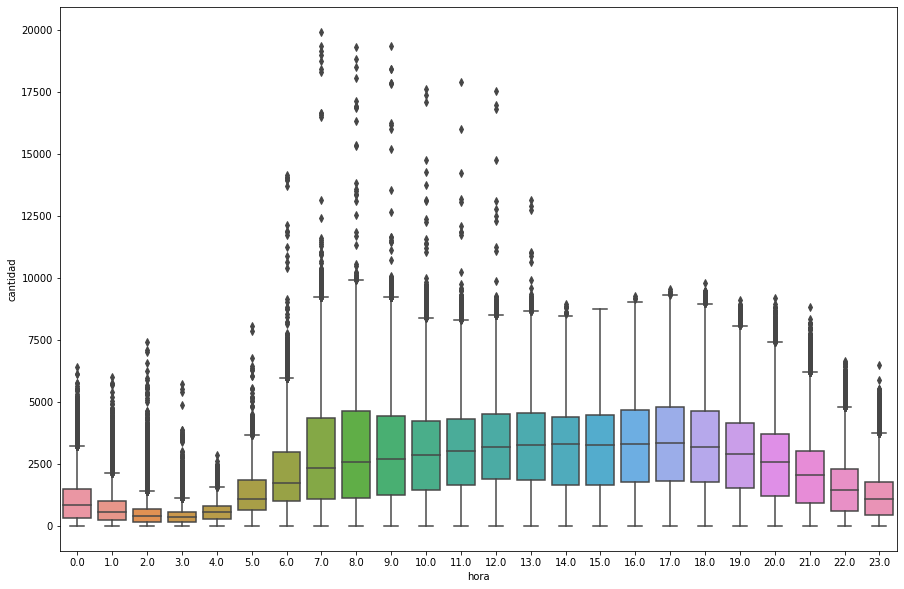

In [ ]:
plt.figure(figsize=(15,10))
sns.boxplot(data=df, x='hora',y='cantidad' )
plt.show()

In [ ]:
import plotly.express as px
px.set_mapbox_access_token(open(".mapbox_token.txt").read())
fig = px.scatter_mapbox(df.sample(frac=0.5), lat="lat", lon="long",color='autopista_nombre',
                  center={'lat':-34.61315,'lon':-58.37723} ,color_continuous_scale=px.colors.cyclical.IceFire, 
                  size_max=15, zoom=10)
fig.show()

# Models

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, median_absolute_error, r2_score, explained_variance_score, mean_absolute_percentage_error
import pickle

In [ ]:
import tensorflow as tf

In [ ]:
disp_ubicacion_enc = LabelEncoder()
disp_nombre_enc = LabelEncoder()
autopista_nombre_enc = LabelEncoder()

disp_ubicacion_enc.fit(df.disp_ubicacion)
disp_nombre_enc.fit(df.disp_nombre)
autopista_nombre_enc.fit(df.autopista_nombre)

df['disp_ubicacion_enc'] = disp_ubicacion_enc.transform(df.disp_ubicacion)
df['disp_nombre_enc'] = disp_nombre_enc.transform(df.disp_nombre)
df['autopista_nombre_enc'] = autopista_nombre_enc.transform(df.autopista_nombre)

In [ ]:
df_final = df[['year','mes','hora','autopista_nombre_enc','disp_ubicacion_enc',
               'disp_nombre_enc','dia_semana','holyday','cantidad']]
df_dummies = pd.get_dummies(data=df_final, 
               columns=['year','mes','hora','autopista_nombre_enc','disp_ubicacion_enc',
                       'disp_nombre_enc','dia_semana'])

df_dummies['holyday'] = df_dummies['holyday'].astype(int)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_dummies.drop('cantidad', axis=1,inplace=False).to_numpy(), 
                                                    df_dummies.cantidad.values, test_size=0.2)

## Train models

### Linear Model

In [ ]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_train_predict_lr = lr.predict(X_train)
print('lr train metrics:')
print('rsme: ', mean_squared_error(y_train, y_train_predict_lr))
print('mae: ', median_absolute_error(y_train, y_train_predict_lr))
print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_train, y_train_predict_lr))
print('r2: ', r2_score(y_train, y_train_predict_lr))
print('explained_variance_score: ', explained_variance_score(y_train, y_train_predict_lr))

print('\n')

y_predict_lr = lr.predict(X_test)
print('lr test metrics:')
print('rsme: ', mean_squared_error(y_test, y_predict_lr))
print('mae: ', median_absolute_error(y_test, y_predict_lr))
print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_test, y_predict_lr))
print('r2: ', r2_score(y_test, y_predict_lr))
print('explained_variance_score: ', explained_variance_score(y_test, y_predict_lr))

lr train metrics:
rsme:  1679457.2847018999
mae:  760.0
mean_absolute_percentage_error:  2.8997296294320012e+16
r2:  0.59792640167262
explained_variance_score:  0.597934771756947


lr test metrics:
rsme:  1685783.8086036886
mae:  764.0
mean_absolute_percentage_error:  2.906158192568445e+16
r2:  0.598118420917525
explained_variance_score:  0.5981286579619736


### Random Forest

In [ ]:
rfr = RandomForestRegressor(random_state=42,n_jobs=-1,verbose=1)
rfr.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 10.5min finished


RandomForestRegressor(n_jobs=-1, random_state=42, verbose=1)

In [ ]:
y_train_predict_rfr = rfr.predict(X_train)
print('rfr train metrics:')
print('rsme: ', mean_squared_error(y_train, y_train_predict_rfr))
print('mae: ', median_absolute_error(y_train, y_train_predict_rfr))
print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_train, y_train_predict_rfr))
print('r2: ', r2_score(y_train, y_train_predict_rfr))
print('explained_variance_score: ', explained_variance_score(y_train, y_train_predict_rfr))

print('\n')

y_predict_rfr = rfr.predict(X_test)
print('rfr test metrics:')
print('rsme: ', mean_squared_error(y_test, y_predict_rfr))
print('mae: ', median_absolute_error(y_test, y_predict_rfr))
print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_test, y_predict_rfr))
print('r2: ', r2_score(y_test, y_predict_rfr))
print('explained_variance_score: ', explained_variance_score(y_test, y_predict_rfr))

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    9.1s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   18.8s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.


rfr train metrics:
rsme:  417136.3063448722
mae:  141.41486824286812
mean_absolute_percentage_error:  1.0384152921680822e+16
r2:  0.9001347058881316
explained_variance_score:  0.9001347099937266




[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    2.1s


rfr test metrics:
rsme:  750336.7511507714
mae:  200.60584523809484
mean_absolute_percentage_error:  1.377914005787492e+16
r2:  0.8211238494182401
explained_variance_score:  0.8211239819308601


[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    4.8s finished


### Neural Network

In [ ]:
def build_model():
  model = tf.keras.models.Sequential()
  model.add(tf.keras.layers.Dense(64,input_shape=X_train.shape[1:], activation='relu'))
  model.add(tf.keras.layers.Dropout(0.2))
  model.add(tf.keras.layers.Dense(128, activation='relu'))
  model.add(tf.keras.layers.Dropout(0.2))
  model.add(tf.keras.layers.Dense(256, activation='relu'))
  model.add(tf.keras.layers.Dropout(0.2))
  model.add(tf.keras.layers.Dense(64, activation='relu'))
  model.add(tf.keras.layers.Dropout(0.2))
  model.add(tf.keras.layers.Dense(64, activation='relu'))
  model.add(tf.keras.layers.Dense(1))
  optimizer = tf.keras.optimizers.RMSprop(0.005)
 
  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [ ]:
model = build_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                7296      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 128)               8320      
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               33024     
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 64)                1

In [ ]:
class PrintDot(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs):
    if epoch % 100 == 0: print('')
    print('.', end='')

EPOCHS = 10

history = model.fit(
  X_train, y_train,
  epochs=EPOCHS, validation_split = 0.2, verbose=1,
  callbacks=[PrintDot()],batch_size=2**5 ,validation_data = (X_test, y_test))

Epoch 1/10
20409/20409 [==============================] - 90s 4ms/step - loss: 1060153.6250 - mae: 665.2997 - mse: 1060153.6250 - val_loss: 1307733.8750 - val_mae: 788.4498 - val_mse: 1307733.8750
Epoch 2/10
20409/20409 [==============================] - 86s 4ms/step - loss: 915147.0625 - mae: 604.9941 - mse: 915147.0625 - val_loss: 1459062.1250 - val_mae: 842.6473 - val_mse: 1459062.1250
Epoch 3/10
20409/20409 [==============================] - 84s 4ms/step - loss: 892739.0000 - mae: 594.0666 - mse: 892739.0000 - val_loss: 1263623.7500 - val_mae: 765.2264 - val_mse: 1263623.7500
Epoch 4/10
20409/20409 [==============================] - 89s 4ms/step - loss: 885179.6250 - mae: 589.7440 - mse: 885179.6250 - val_loss: 1804271.8750 - val_mae: 940.1444 - val_mse: 1804271.8750
Epoch 5/10
20409/20409 [==============================] - 86s 4ms/step - loss: 880391.5625 - mae: 586.9992 - mse: 880391.5625 - val_loss: 1244183.0000 - val_mae: 766.5887 - val_mse: 1244183.0000
Epoch 6/10
20409/20409 

In [ ]:
y_train_predict_nn = model.predict(X_train)
print('Neural network train metrics:')
print('rsme: ', mean_squared_error(y_train, y_train_predict_nn))
print('mae: ', median_absolute_error(y_train, y_train_predict_nn))
print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_train, y_train_predict_nn))
print('r2: ', r2_score(y_train, y_train_predict_nn))
print('explained_variance_score: ', explained_variance_score(y_train, y_train_predict_nn))

print('\n')

y_predict_nn = model.predict(X_test)
print('Neural network test metrics:')
print('rsme: ', mean_squared_error(y_test, y_predict_nn))
print('mae: ', median_absolute_error(y_test, y_predict_nn))
print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_test, y_predict_nn))
print('r2: ', r2_score(y_test, y_predict_nn))
print('explained_variance_score: ', explained_variance_score(y_test, y_predict_nn))

20409/20409 [==============================] - 28s 1ms/step
Neural network train metrics:
rsme:  1540941.8915411108
mae:  545.8546752929688
mean_absolute_percentage_error:  1.3186719382304102e+16
r2:  0.6310879372824856
explained_variance_score:  0.7469098819735458


5103/5103 [==============================] - 7s 1ms/step
Neural network test metrics:
rsme:  1535412.5820585655
mae:  541.0348510742188
mean_absolute_percentage_error:  1.3400043448498368e+16
r2:  0.6339660934744095
explained_variance_score:  0.7491018102680096


## Save model

In [ ]:
!mkdir /content/models
!mkdir /content/models/model
!mkdir /content/models/encoder

In [ ]:
pickle.dump(lr, open('/content/models/model/model.pkl', 'wb'))

In [ ]:
pickle.dump(disp_ubicacion_enc, open('/content/models/encoder/disp_ubicacion_enc.pkl', 'wb'))
pickle.dump(disp_nombre_enc, open('/content/models/encoder/disp_nombre_enc.pkl', 'wb'))
pickle.dump(autopista_nombre_enc, open('/content/models/encoder/autopista_nombre_enc.pkl', 'wb'))

In [73]:
pickle.dump(df_dummies.columns, open('/content/models/columns.pkl','wb'))

In [ ]:
!cp -av /content/models/ /content/drive/MyDrive/prueba/multiplica_talent/